In [76]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.offline as pyo
import plotly.graph_objects as go

from plotly.subplots import make_subplots

pyo.init_notebook_mode(connected=True)
pd.options.plotting.backend = 'plotly'

In [78]:
df = yf.download(['^CNXFMCG', 'HINDUNILVR.NS', 'ITC.NS', 'NESTLEIND.NS','BRITANNIA.NS', 'VBL.NS'], start='2015-01-01')
df.dropna()

[*********************100%***********************]  6 of 6 completed


Price             Close                                                     \
Ticker     BRITANNIA.NS HINDUNILVR.NS      ITC.NS NESTLEIND.NS      VBL.NS   
Date                                                                         
2016-11-08  1423.302856    732.535034  176.188919   286.340790   26.483915   
2016-11-09  1374.320312    718.397827  171.053513   283.509277   25.034363   
2016-11-10  1409.490112    709.941467  173.052521   284.938446   25.149633   
2016-11-11  1354.591309    695.370667  167.469055   277.622009   25.397469   
2016-11-15  1288.606934    698.579651  163.712311   264.413757   25.250500   
...                 ...           ...         ...          ...         ...   
2026-02-11  6019.000000   2462.899902  318.250000  1305.300049  456.899994   
2026-02-12  6102.000000   2409.699951  317.450012  1305.500000  455.700012   
2026-02-13  5980.500000   2305.199951  313.750000  1282.599976  449.299988   
2026-02-16  6106.000000   2319.000000  317.950012  1289.800049  455.850006   
2026-02-17  6127.000000   2310.500000  320.700012  1283.599976  455.350006   

Price                            High                                         \
Ticker          ^CNXFMCG BRITANNIA.NS HINDUNILVR.NS      ITC.NS NESTLEIND.NS   
Date                                                                           
2016-11-08  21902.849609  1452.401879    734.399785  177.429685   288.881688   
2016-11-09  21414.349609  1404.013233    724.512394  175.775315   286.704804   
2016-11-10  21561.099609  1426.074247    730.193327  174.396686   290.406342   
2016-11-11  20825.900391  1403.199728    706.862605  171.604937   287.951959   
2016-11-15  20307.949219  1347.838774    702.352454  170.191874   279.381651   
...                  ...          ...           ...         ...          ...   
2026-02-11  52152.101562  6156.000000   2470.600098  322.200012  1324.900024   
2026-02-12  51885.750000  6148.000000   2479.600098  320.399994  1312.099976   
2026-02-13  50902.148438  6098.500000   2400.000000  318.399994  1310.400024   
2026-02-16  51318.851562  6134.000000   2327.000000  318.250000  1295.500000   
2026-02-17  51417.500000  6136.500000   2326.000000  321.000000  1289.599976   

Price       ...        Open                                         \
Ticker      ...      ITC.NS NESTLEIND.NS      VBL.NS      ^CNXFMCG   
Date        ...                                                      
2016-11-08  ...  176.809302   286.797940   24.783642  21944.599609   
2016-11-09  ...  164.849673   272.462559   22.651098  20734.800781   
2016-11-10  ...  174.293287   286.265471   25.705824  21774.849609   
2016-11-11  ...  170.950092   287.951959   25.014185  21351.500000   
2016-11-15  ...  166.779763   277.832716   25.244736  20814.300781   
...         ...         ...          ...         ...           ...   
2026-02-11  ...  321.950012  1315.000000  456.500000  52335.949219   
2026-02-12  ...  317.299988  1312.099976  457.000000  52212.699219   
2026-02-13  ...  316.000000  1305.000000  452.500000  51690.050781   
2026-02-16  ...  313.750000  1276.699951  447.000000  50809.550781   
2026-02-17  ...  318.450012  1281.000000  455.000000  51246.199219   

Price            Volume                                                    \
Ticker     BRITANNIA.NS HINDUNILVR.NS    ITC.NS NESTLEIND.NS       VBL.NS   
Date                                                                        
2016-11-08       906756        797363  10317962       257060  305744118.0   
2016-11-09       451680       2122893  23914156       807420   13691733.0   
2016-11-10       274548       1017007  12012673       393880    7757505.0   
2016-11-11       432078       1758762  13232720       885140    5469221.0   
2016-11-15      1158490       2007604  22012736      2123260    6065128.0   
...                 ...           ...       ...          ...          ...   
2026-02-11       771051       1137856  24843366       911500    2466686.0   
2026-02-12       455997       46561

In [80]:
df.Close.dropna()

Ticker,BRITANNIA.NS,HINDUNILVR.NS,ITC.NS,NESTLEIND.NS,VBL.NS,^CNXFMCG
Date,,,,,,
2016-11-08,1423.302856,732.535034,176.188919,286.340790,26.483915,21902.849609
2016-11-09,1374.320312,718.397827,171.053513,283.509277,25.034363,21414.349609
2016-11-10,1409.490112,709.941467,173.052521,284.938446,25.149633,21561.099609
2016-11-11,1354.591309,695.370667,167.469055,277.622009,25.397469,20825.900391
2016-11-15,1288.606934,698.579651,163.712311,264.413757,25.250500,20307.949219
...,...,...,...,...,...,...
2026-02-11,6019.000000,2462.899902,318.250000,1305.300049,456.899994,52152.101562
2026-02-12,6102.000000,2409.699951,317.450012,1305.500000,455.700012,51885.750000
2026-02-13,5980.500000,2305.199951,313.750000,1282.599976,449.299988,50902.148438


# Log Returns

In [83]:
log_returns = np.log(df.Close/df.Close.shift(1)).dropna()
log_returns

Ticker,BRITANNIA.NS,HINDUNILVR.NS,ITC.NS,NESTLEIND.NS,VBL.NS,^CNXFMCG
Date,,,,,,
2016-11-09,-0.035021,-0.019488,-0.029580,-0.009938,-0.056288,-0.022556
2016-11-10,0.025269,-0.011841,0.011619,0.005028,0.004594,0.006830
2016-11-11,-0.039728,-0.020737,-0.032797,-0.026013,0.009806,-0.034693
2016-11-15,-0.049938,0.004604,-0.022688,-0.048745,-0.005804,-0.025185
2016-11-16,0.020827,0.004089,-0.028183,0.001334,-0.005493,-0.008995
...,...,...,...,...,...,...
2026-02-11,0.024470,0.003783,-0.009849,-0.002525,0.000876,0.000415
2026-02-12,0.013695,-0.021837,-0.002517,0.000153,-0.002630,-0.005120
2026-02-13,-0.020112,-0.044335,-0.011724,-0.017697,-0.014144,-0.019139


# Daily Cummulative Returns

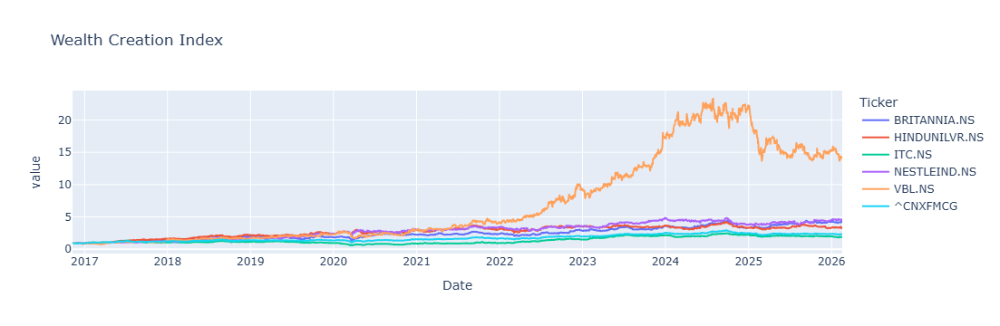

In [86]:
daily_cum_returns = np.exp(log_returns.cumsum())
daily_cum_returns.plot(title = 'Wealth Creation Index')

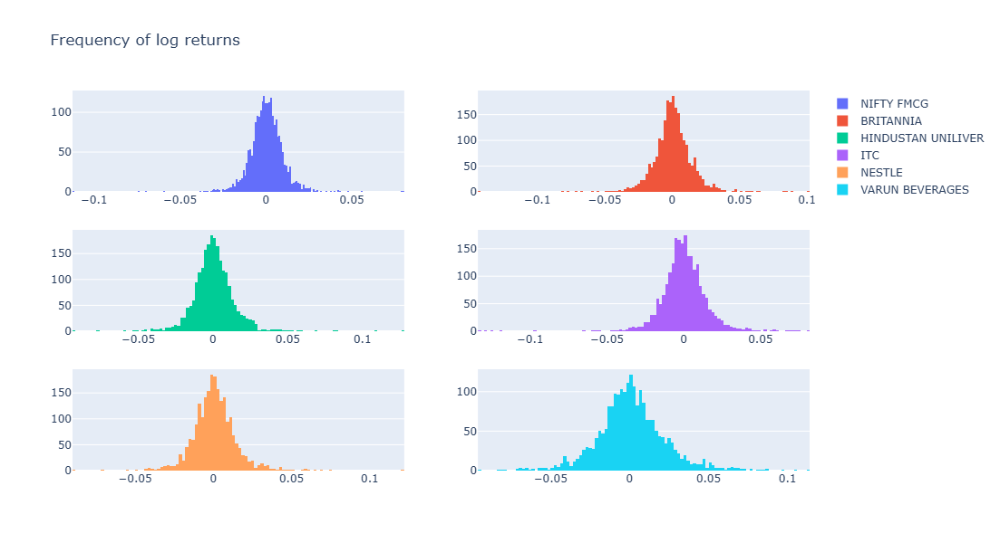

In [88]:
fig = make_subplots(rows=3, cols=2)

img0 = go.Histogram(x=log_returns['^CNXFMCG'], name='NIFTY FMCG')
img1 = go.Histogram(x=log_returns['BRITANNIA.NS'], name='BRITANNIA')
img2 = go.Histogram(x=log_returns['HINDUNILVR.NS'], name='HINDUSTAN UNILIVER')
img3 = go.Histogram(x=log_returns['ITC.NS'], name='ITC')
img4 = go.Histogram(x=log_returns['NESTLEIND.NS'], name='NESTLE')
img5 = go.Histogram(x=log_returns['VBL.NS'], name='VARUN BEVERAGES')

fig.append_trace(img0, 1, 1)  #This is in terms of rows and columns
fig.append_trace(img1, 1, 2)
fig.append_trace(img2, 2, 1)
fig.append_trace(img3, 2, 2)
fig.append_trace(img4, 3, 1)
fig.append_trace(img5, 3, 2)

fig.update_layout(autosize=False, width=1100, height=600, title='Frequency of log returns')

fig.show()

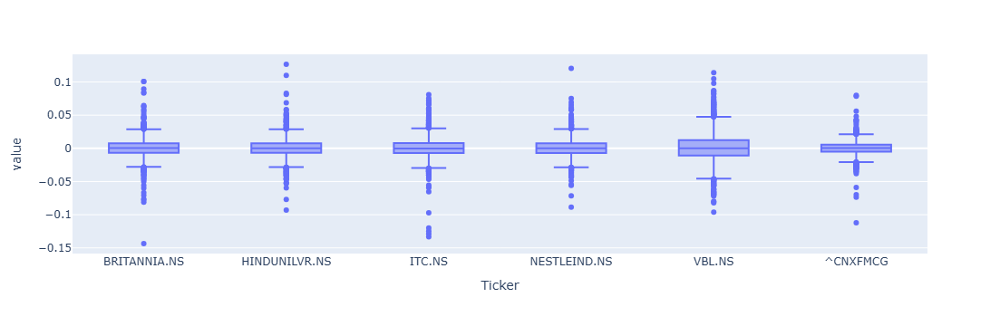

In [90]:
log_returns.plot(kind='box')

# Daily Standard Deviation

In [93]:
daily_std = log_returns.std()
daily_std

Ticker
BRITANNIA.NS     0.014598
HINDUNILVR.NS    0.013783
ITC.NS           0.015114
NESTLEIND.NS     0.013746
VBL.NS           0.021860
^CNXFMCG         0.010068
dtype: float64

# Annualized Volatility

In [96]:
annualized_volatility = daily_std * np.sqrt(252)
annualized_volatility

Ticker
BRITANNIA.NS     0.231741
HINDUNILVR.NS    0.218806
ITC.NS           0.239934
NESTLEIND.NS     0.218210
VBL.NS           0.347010
^CNXFMCG         0.159818
dtype: float64

# Historical Rolling Volatility

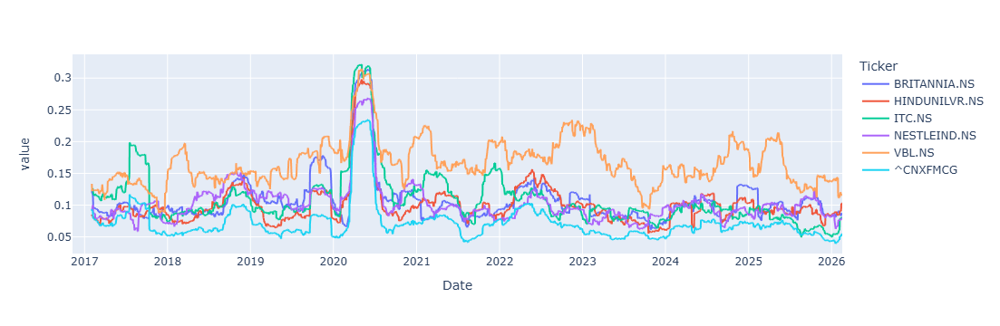

In [105]:
Trading_Days = 60

historical_volatility = log_returns.rolling(window = Trading_Days).std() * np.sqrt(Trading_Days)
historical_volatility.plot()

# Sharpe Ratio

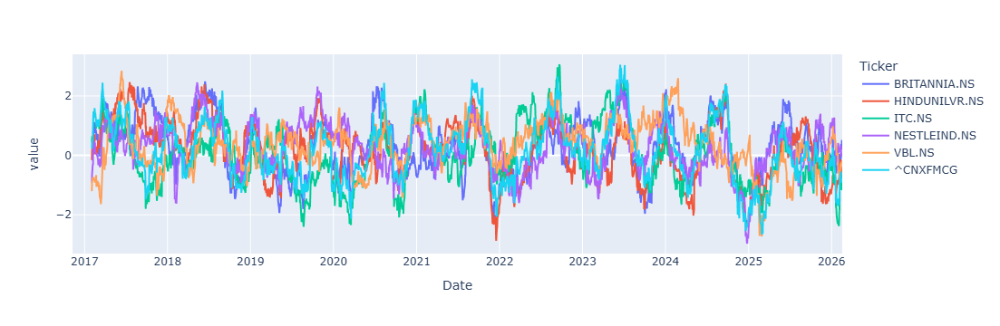

In [108]:
Rf = 0.06/252

Sharpe_Ratio = (log_returns.rolling(window = Trading_Days).mean() - Rf) * Trading_Days/historical_volatility
Sharpe_Ratio.plot()

# Sortino Ratio

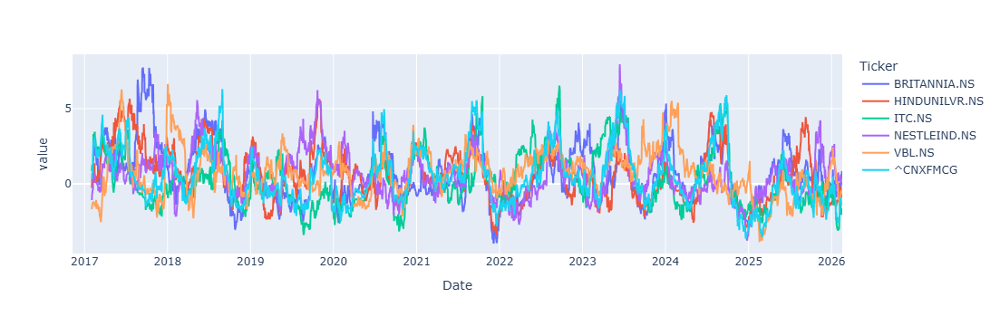

In [117]:
# Here I'm taking a downside risk which is less than 0 on any given day

Sortino_volatility = log_returns[log_returns<0].rolling(window=Trading_Days, min_periods=10).std() * np.sqrt(Trading_Days)

Sortino_Ratio = (log_returns.rolling(window = Trading_Days).mean() - Rf) * Trading_Days/Sortino_volatility

Sortino_Ratio.plot()

# Drawdown Analysis

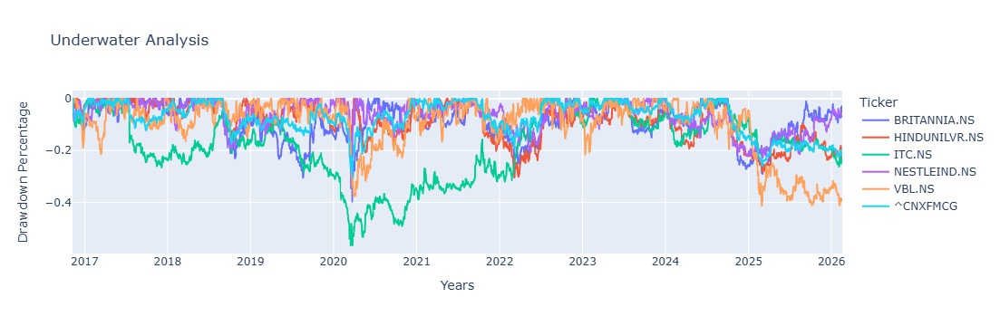

In [129]:
peak = daily_cum_returns.cummax()

drawdown = daily_cum_returns / peak - 1

drawdown.plot(title='Underwater Analysis',
              labels ={'value':'Drawdown Percentage', 'Date':'Years'})

# Maximum Drawdown

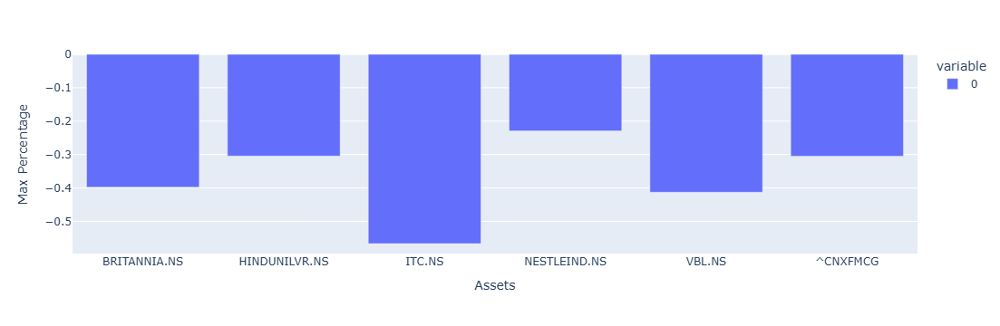

In [133]:
Max_dd = drawdown.min()
Max_dd.plot(kind='bar',
           labels={'value':'Max Percentage', 'Ticker':'Assets'})